# This notebook outputs sample images from the hubble catalog in ranges of redshift, surface brightness, and p_features. Each image displays the weighted and debiased p_features values so that the effects of the debiasing can be visually inspected. 


In [92]:
%pylab inline
from PIL import Image
import urllib, cStringIO
from astropy.table import Table
import numpy as np

import matplotlib.gridspec as gridspec
mpl.rcParams['text.usetex']=True


Populating the interactive namespace from numpy and matplotlib


`%matplotlib` prevents importing * from pylab and numpy


In [12]:
#hubble data
data=Table.read('gz_hubble_catalog_10_6_2015.fits')

In [22]:
cats=list(set(data['Correctable_Category']))
correctable=cats[0]

In [17]:
def get_image_from_url(url):

    file = cStringIO.StringIO(urllib.urlopen(url).read())
    img = Image.open(file)
    return img

In [38]:
def galaxies_list(zl,zh,mul,muh,pl,ph):
    #get list of galaxies within certain ranges of z, mu and p_features 
    these_data=(data['Z']>=zl) & (data['Z'] < zh) & (data['MU_HI']>=mul) & (data['MU_HI'] < muh) & (data['t01_smooth_or_features_a02_features_or_disk_weighted_fraction'] >=pl) & (data['t01_smooth_or_features_a02_features_or_disk_weighted_fraction'] < ph) & (data['Correctable_Category']==correctable)
    return data[these_data]

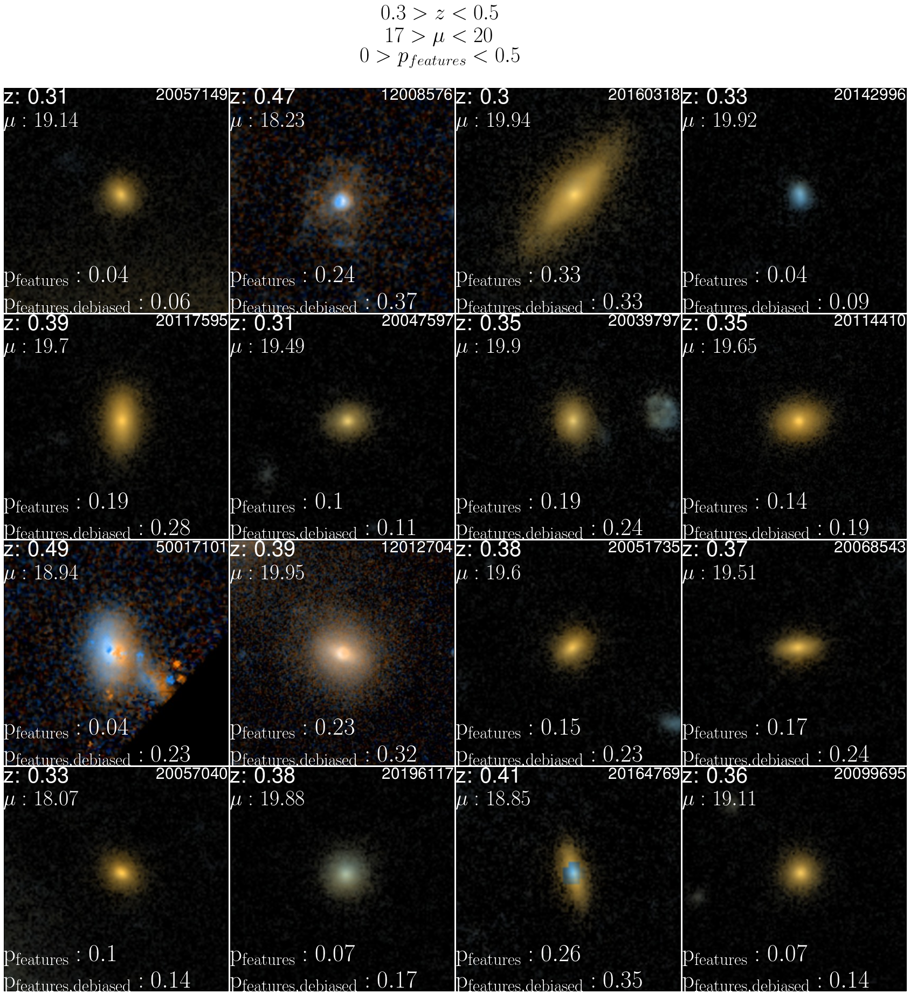

In [148]:
gs=gridspec.GridSpec(4,4)
gs.update(wspace=0.01)
gs.update(hspace=0.01)

#define upper and lower limits of z, mu, and p_features to look at:
zl = .3
zh = .5
mul = 17
muh = 20
pl = 0
ph = .5
 
these_data=galaxies_list(zl,zh,mul,muh,pl,ph)
if len(these_data) < 20:
    print 'try new values'

#shuffle which galaxies get displayed     
n_list=np.linspace(0,len(these_data)-1,len(these_data))
shuffle(n_list)

f=plt.figure(figsize=(30,30))
n=0
for i in range (0,4):
    for j in range(0,4):
        ax=plt.subplot(gs[i,j])
        while 'h' not in these_data[int(n_list[n])]['location']:
            n+=1
        gal = these_data[int(n_list[n])] # random galaxy from big list 
        plt.imshow(get_image_from_url(gal['location']))
        plt.tick_params(labelbottom='off',labelleft='off')
        ax.annotate('z: %s\n$\mu: %s$'%(round(gal['Z'],2),round(gal['MU_HI'],2)),fontsize=40,xy=(0,1),
            xycoords='axes fraction',verticalalignment='top',color='white')
        ax.annotate('%s'%gal['OBJNO'],fontsize=30,xy=(1,1),
            xycoords='axes fraction',verticalalignment='top',horizontalalignment='right',color='white')
        ax.annotate('$\mathrm{p_{features}: %s}$\n$\mathrm{p_{features,debiased}: %s}$'%(round(gal['t01_smooth_or_features_a02_features_or_disk_weighted_fraction'],2),round(gal['t01_smooth_or_features_a02_features_or_disk_debiased_fraction'],2)),fontsize=45,xy=(0,0),
            xycoords='axes fraction',color='white')
        n+=1
        

f.text(.5,.92,'$%s > z < %s$\n$%s > \mu < %s$\n$%s > p_{features} < %s$'%(zl,zh,mul,muh,pl,ph), fontsize=40,ha='center')





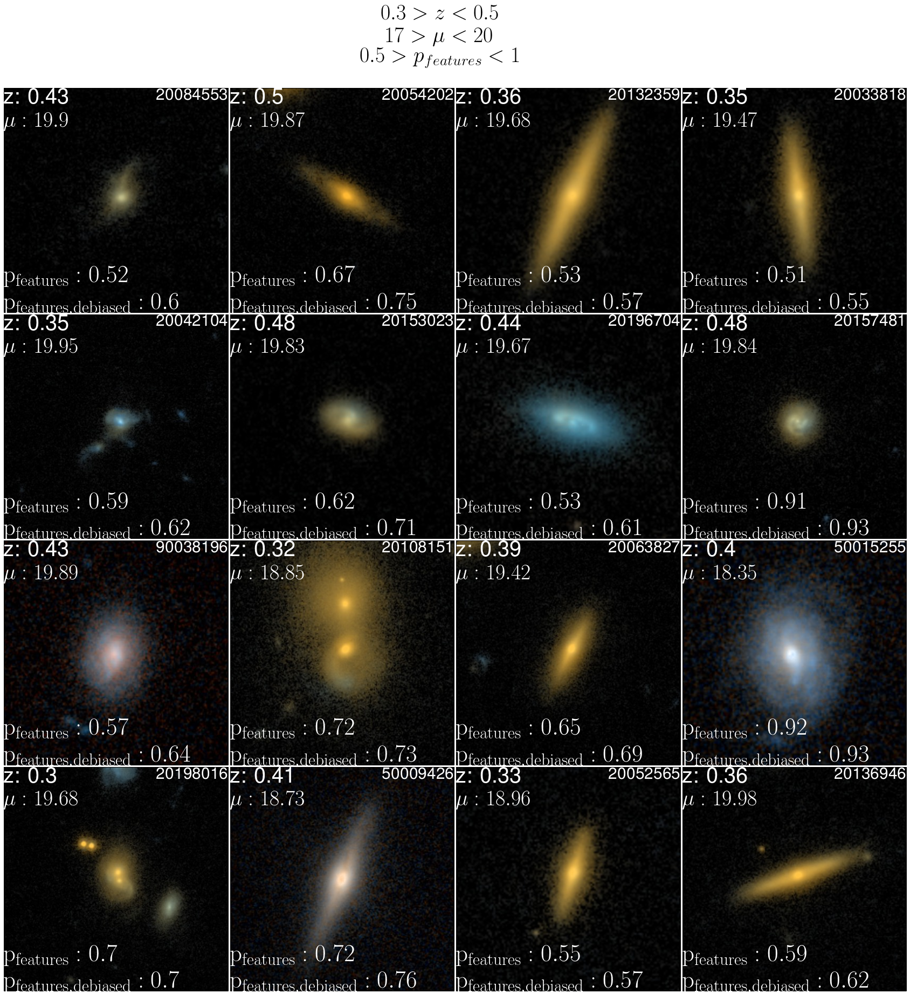

In [146]:
gs=gridspec.GridSpec(4,4)
gs.update(wspace=0.01)
gs.update(hspace=0.01)

#define upper and lower limits of z, mu, and p_features to look at:
zl = .3
zh = .5
mul = 17
muh = 20
pl = .5
ph = 1
 
these_data=galaxies_list(zl,zh,mul,muh,pl,ph)
if len(these_data) < 20:
    print 'try new values'

#shuffle which galaxies get displayed     
n_list=np.linspace(0,len(these_data)-1,len(these_data))
shuffle(n_list)

f=plt.figure(figsize=(30,30))
n=0
for i in range (0,4):
    for j in range(0,4):
        ax=plt.subplot(gs[i,j])
        while 'h' not in these_data[int(n_list[n])]['location']:
            n+=1
        gal = these_data[int(n_list[n])] # random galaxy from big list 
        plt.imshow(get_image_from_url(gal['location']))
        plt.tick_params(labelbottom='off',labelleft='off')
        ax.annotate('z: %s\n$\mu: %s$'%(round(gal['Z'],2),round(gal['MU_HI'],2)),fontsize=40,xy=(0,1),
            xycoords='axes fraction',verticalalignment='top',color='white')
        ax.annotate('%s'%gal['OBJNO'],fontsize=30,xy=(1,1),
            xycoords='axes fraction',verticalalignment='top',horizontalalignment='right',color='white')
        ax.annotate('$\mathrm{p_{features}: %s}$\n$\mathrm{p_{features,debiased}: %s}$'%(round(gal['t01_smooth_or_features_a02_features_or_disk_weighted_fraction'],2),round(gal['t01_smooth_or_features_a02_features_or_disk_debiased_fraction'],2)),fontsize=45,xy=(0,0),
            xycoords='axes fraction',color='white')
        n+=1
        

f.text(.5,.92,'$%s > z < %s$\n$%s > \mu < %s$\n$%s > p_{features} < %s$'%(zl,zh,mul,muh,pl,ph), fontsize=40,ha='center')


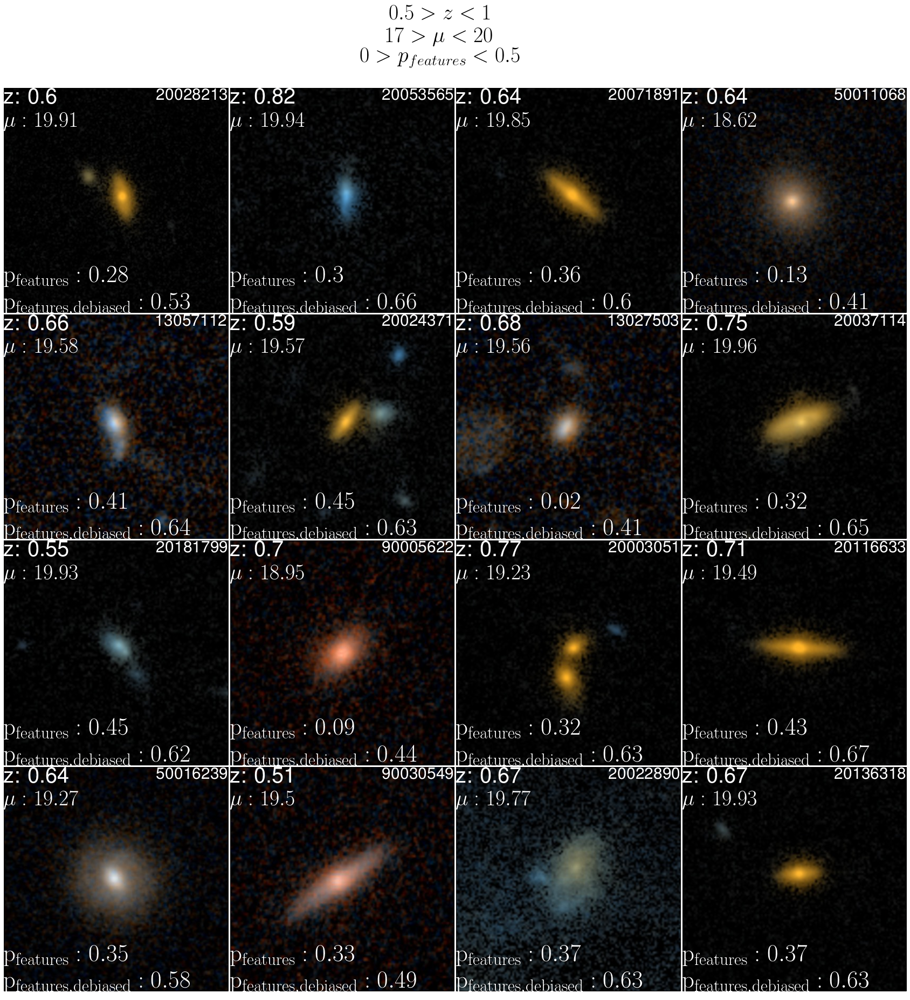

In [149]:
gs=gridspec.GridSpec(4,4)
gs.update(wspace=0.01)
gs.update(hspace=0.01)

#define upper and lower limits of z, mu, and p_features to look at:
zl = .5
zh = 1
mul = 17
muh = 20
pl = 0
ph = .5
 
these_data=galaxies_list(zl,zh,mul,muh,pl,ph)
if len(these_data) < 20:
    print 'try new values'

#shuffle which galaxies get displayed     
n_list=np.linspace(0,len(these_data)-1,len(these_data))
shuffle(n_list)

f=plt.figure(figsize=(30,30))
n=0
for i in range (0,4):
    for j in range(0,4):
        ax=plt.subplot(gs[i,j])
        while 'h' not in these_data[int(n_list[n])]['location']:
            n+=1
        gal = these_data[int(n_list[n])] # random galaxy from big list 
        plt.imshow(get_image_from_url(gal['location']))
        plt.tick_params(labelbottom='off',labelleft='off')
        ax.annotate('z: %s\n$\mu: %s$'%(round(gal['Z'],2),round(gal['MU_HI'],2)),fontsize=40,xy=(0,1),
            xycoords='axes fraction',verticalalignment='top',color='white')
        ax.annotate('%s'%gal['OBJNO'],fontsize=30,xy=(1,1),
            xycoords='axes fraction',verticalalignment='top',horizontalalignment='right',color='white')
        ax.annotate('$\mathrm{p_{features}: %s}$\n$\mathrm{p_{features,debiased}: %s}$'%(round(gal['t01_smooth_or_features_a02_features_or_disk_weighted_fraction'],2),round(gal['t01_smooth_or_features_a02_features_or_disk_debiased_fraction'],2)),fontsize=45,xy=(0,0),
            xycoords='axes fraction',color='white')
        n+=1
        

f.text(.5,.92,'$%s > z < %s$\n$%s > \mu < %s$\n$%s > p_{features} < %s$'%(zl,zh,mul,muh,pl,ph), fontsize=40,ha='center')


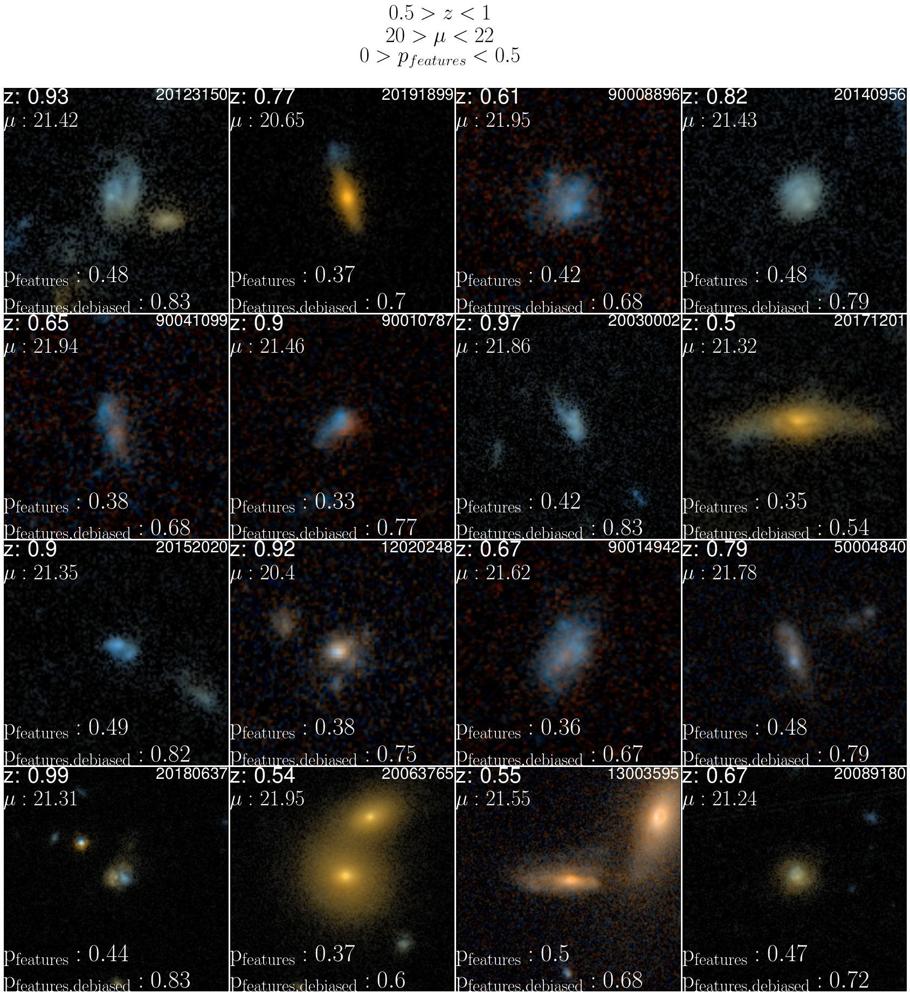

In [151]:
gs=gridspec.GridSpec(4,4)
gs.update(wspace=0.01)
gs.update(hspace=0.01)

#define upper and lower limits of z, mu, and p_features to look at:
zl = .5
zh = 1
mul = 20
muh = 22
pl = 0
ph = .5
 
these_data=galaxies_list(zl,zh,mul,muh,pl,ph)
if len(these_data) < 20:
    print 'try new values'

#shuffle which galaxies get displayed     
n_list=np.linspace(0,len(these_data)-1,len(these_data))
shuffle(n_list)

f=plt.figure(figsize=(30,30))
n=0
for i in range (0,4):
    for j in range(0,4):
        ax=plt.subplot(gs[i,j])
        while 'h' not in these_data[int(n_list[n])]['location']:
            n+=1
        gal = these_data[int(n_list[n])] # random galaxy from big list 
        plt.imshow(get_image_from_url(gal['location']))
        plt.tick_params(labelbottom='off',labelleft='off')
        ax.annotate('z: %s\n$\mu: %s$'%(round(gal['Z'],2),round(gal['MU_HI'],2)),fontsize=40,xy=(0,1),
            xycoords='axes fraction',verticalalignment='top',color='white')
        ax.annotate('%s'%gal['OBJNO'],fontsize=30,xy=(1,1),
            xycoords='axes fraction',verticalalignment='top',horizontalalignment='right',color='white')
        ax.annotate('$\mathrm{p_{features}: %s}$\n$\mathrm{p_{features,debiased}: %s}$'%(round(gal['t01_smooth_or_features_a02_features_or_disk_weighted_fraction'],2),round(gal['t01_smooth_or_features_a02_features_or_disk_debiased_fraction'],2)),fontsize=45,xy=(0,0),
            xycoords='axes fraction',color='white')
        n+=1
        

f.text(.5,.92,'$%s > z < %s$\n$%s > \mu < %s$\n$%s > p_{features} < %s$'%(zl,zh,mul,muh,pl,ph), fontsize=40,ha='center')


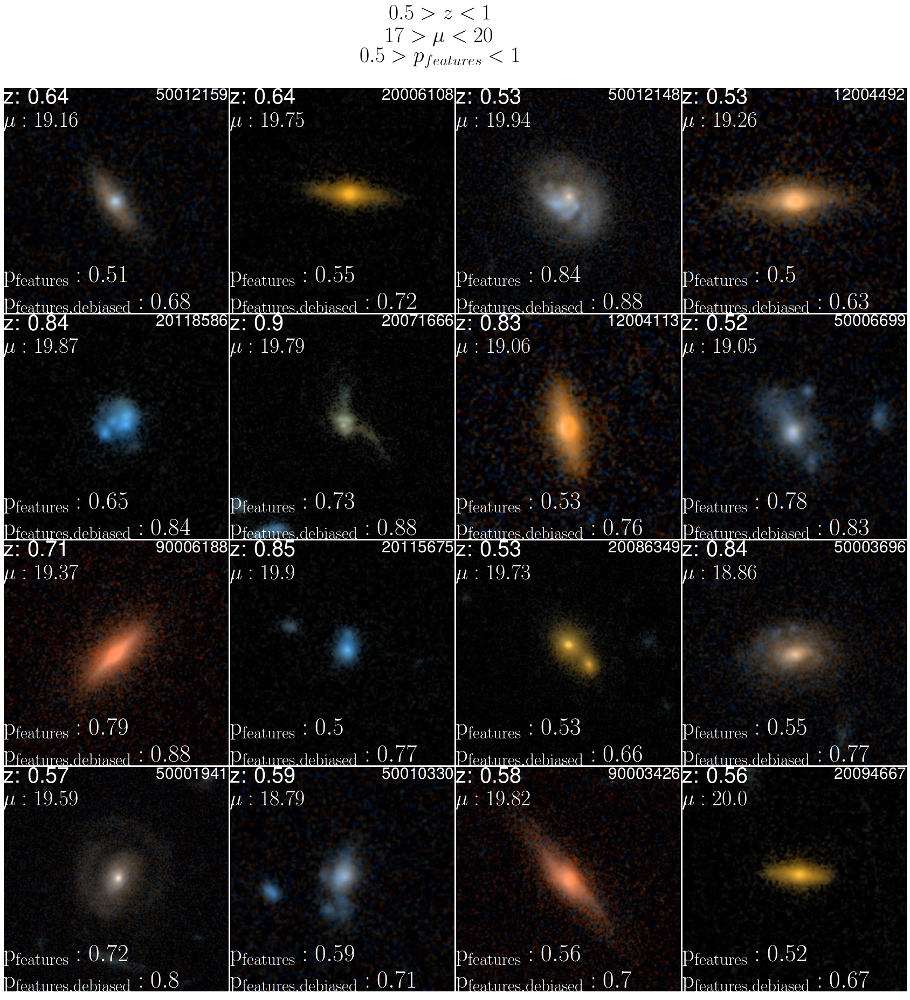

In [150]:
gs=gridspec.GridSpec(4,4)
gs.update(wspace=0.01)
gs.update(hspace=0.01)

#define upper and lower limits of z, mu, and p_features to look at:
zl = .5
zh = 1
mul = 17
muh = 20
pl = .5
ph = 1
 
these_data=galaxies_list(zl,zh,mul,muh,pl,ph)
if len(these_data) < 20:
    print 'try new values'

#shuffle which galaxies get displayed     
n_list=np.linspace(0,len(these_data)-1,len(these_data))
shuffle(n_list)

f=plt.figure(figsize=(30,30))
n=0
for i in range (0,4):
    for j in range(0,4):
        ax=plt.subplot(gs[i,j])
        while 'h' not in these_data[int(n_list[n])]['location']:
            n+=1
        gal = these_data[int(n_list[n])] # random galaxy from big list 
        plt.imshow(get_image_from_url(gal['location']))
        plt.tick_params(labelbottom='off',labelleft='off')
        ax.annotate('z: %s\n$\mu: %s$'%(round(gal['Z'],2),round(gal['MU_HI'],2)),fontsize=40,xy=(0,1),
            xycoords='axes fraction',verticalalignment='top',color='white')
        ax.annotate('%s'%gal['OBJNO'],fontsize=30,xy=(1,1),
            xycoords='axes fraction',verticalalignment='top',horizontalalignment='right',color='white')
        ax.annotate('$\mathrm{p_{features}: %s}$\n$\mathrm{p_{features,debiased}: %s}$'%(round(gal['t01_smooth_or_features_a02_features_or_disk_weighted_fraction'],2),round(gal['t01_smooth_or_features_a02_features_or_disk_debiased_fraction'],2)),fontsize=45,xy=(0,0),
            xycoords='axes fraction',color='white')
        n+=1
        

f.text(.5,.92,'$%s > z < %s$\n$%s > \mu < %s$\n$%s > p_{features} < %s$'%(zl,zh,mul,muh,pl,ph), fontsize=40,ha='center')
